In [1]:
# os: Operating System의 줄임말로, 운영체제에서 제공되는 여러 기능을 파이썬에서 사용할 수 있도록 함 (Ex. 디렉토리 경로 이동, 시스템 환경 변수 가져오기 등)
# urllib: URL 작업을 위한 여러 모듈을 모은 패키지. (Ex. urllib.request, urllib.parse, ...)
# cv2: OpenCV 라이브러리로, 실시간 컴퓨터 비전을 목적으로 한 프로그래밍 라이브러리
# numpy(NumPy): 행렬이나 대규모 다차원 배열을 쉽게 처리할 수 있도록 지원하는 라이브러리. 데이터 구조 외에도 수치 계산을 위해 효율적으로 구현된 기능을 제공
# pixellib: 이미지 및 비디오 segmentation을 수행하기 위한 라이브러리. 
# pixellib.semantic: segmentation 기법 중, semantic segmentation을 쉽게 사용할 수 있도록 만든 라이브러리
# matplotlib: 파이썬 프로그래밍 언어 및 수학적 확장 NumPy 라이브러리를 활용한 플로팅 라이브러리로, 데이터 시각화 도구
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt
import scipy.ndimage

print('슝=3')

슝=3


파일이름을 알려주세요: image2
이미지 크기: (583, 498, 3)


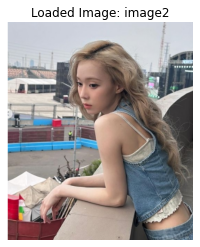

In [26]:
def load_image():
    filename = input('파일이름을 알려주세요: ')
    global img_path, img_orig
    img_path = os.path.join(os.getenv('HOME'), 'aiffel/Portrait_Project/images', filename + '.png')
    img_orig = cv2.imread(img_path)
    if img_orig is None:
        print(f"❌ 없는 파일입니다: {img_path}")
        return
    print(f"이미지 크기: {img_orig.shape}")
    plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"Loaded Image: {filename}")
    plt.show()

load_image()

In [9]:
def pixellib_load():
    global model
    model_dir = os.path.join(os.getenv('HOME'), 'aiffel/Portrait_Project/models')
    model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')
    if not os.path.exists(model_file):
        os.makedirs(model_dir, exist_ok=True)
        url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'
        urllib.request.urlretrieve(url, model_file)
    model = semantic_segmentation()
    model.load_pascalvoc_model(model_file)

pixellib_load()

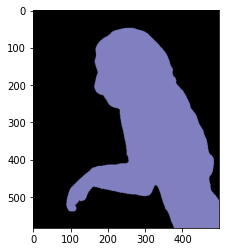

In [10]:
def initial_segmentation():
    global LABEL_NAMES, segvalues, output
    segvalues, output = model.segmentAsPascalvoc(img_path) # segmentAsPascalvoc()함 수 를 호출 하여 입력된 이미지를 분할, 분할 출력의 배열을 가져옴, 분할 은 pacalvoc 데이터로 학습된 모델을 이용
    #pascalvoc 데이터의 라벨종류
    LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
    ]
    len(LABEL_NAMES)
    plt.imshow(output)
    plt.show()

initial_segmentation()

In [11]:
segvalues # segmentAsPascalvoc() 함수를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 배열값을 출력

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True]])}

In [12]:
def print_label():
    #segvalues에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
    for class_id in segvalues['class_ids']:
        print(LABEL_NAMES[class_id])

In [13]:
def make_colormap():
    global colormap, ind, seg_color
    # 아래 코드를 이해하지 않아도 좋습니다
    # PixelLib에서 그대로 가져온 코드입니다
    # 주목해야 할 것은 생상 코드 결과물이예요!

    #컬러맵 만들기 
    colormap = np.zeros((256, 3), dtype = int)
    ind = np.arange(256, dtype=int)

    for shift in reversed(range(8)):
        for channel in range(3):
            colormap[:, channel] |= ((ind >> channel) & 1) << shift
        ind >>= 3

    #print(colormap[:20]) #생성한 20개의 컬러맵 출력
    print('15번째 배열:',colormap[15])
    seg_color = (128,128,192) # 색상순서 변경 - colormap의 배열은 RGB 순이며 output의 배열은 BGR 순서로 채널 배치가 되어 있어서

make_colormap()

15번째 배열: [192 128 128]


(583, 498)


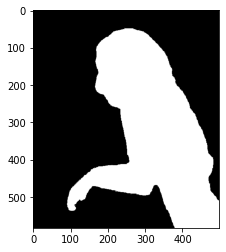

In [14]:
def segment_person():
    global seg_map
    #output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
    # seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 gray로 출력
    # cmap 값을 변경하면 다른 색상으로 확인이 가능함
    seg_map = np.all(output==seg_color, axis=-1) 
    print(seg_map.shape) 
    plt.imshow(seg_map, cmap='gray')
    plt.show()

segment_person()

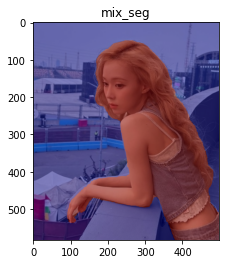

In [15]:
def mix_seg():
    global img_mask,color_mask
    # 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
    img_show = img_orig.copy()

    # True과 False인 값을 각각 255과 0으로 바꿔줍니다
    img_mask = seg_map.astype(np.uint8) * 255

    # 255와 0을 적당한 색상으로 바꿔봅니다
    color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

    # 원본 이미지와 마스트를 적당히 합쳐봅니다
    # 0.6과 0.4는 두 이미지를 섞는 비율입니다.
    # 1.0 은 원본이고요
    # 1.0 은 팔러 팔레트 색으로 나옴
    img_show = cv2.addWeighted(img_show, 0.5, color_mask, 0.5, 0.0)
    
    plt.title("mix_seg")
    plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
    plt.show()

mix_seg()

블러 정도를 입력해주세요:13


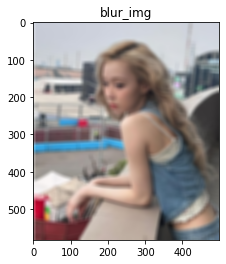

In [16]:

def blur_img():
    Blur_intensity = int(input('블러 정도를 입력해주세요:'))
    global img_orig_blur
    # (13,13)은 blurring kernel size를 뜻합니다
    # 다양하게 바꿔보세요
    img_orig_blur = cv2.blur(img_orig, (Blur_intensity,Blur_intensity))

    # plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
    # cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
    # cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
    # 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
    plt.title("blur_img")
    plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
    plt.show()

blur_img()

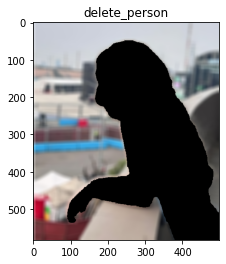

In [21]:
def delete_person():
    global img_mask_color, img_bg_blur
    # cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
    # cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
    # 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경) 
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

    # cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
    # 연산을 하고 나면 배경은 255 사람은 0입니다.
    img_bg_mask = cv2.bitwise_not(img_mask_color)

    # cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
    # 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
    # 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
    img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
    plt.title("delete_person")
    plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
    plt.show()

delete_person()

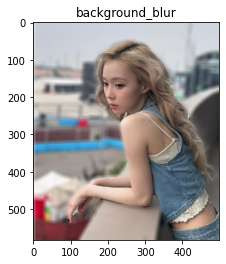

In [22]:
def picture_background_blur():
    # np.where(조건, 참일때, 거짓일때)
    # 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
    # 아닌 영역은 블러된 이미지 값을 사용합니다.
    img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
    # plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
    # cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
    # cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 
    # 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
    plt.title('background_blur')
    plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
    plt.show()

picture_background_blur()

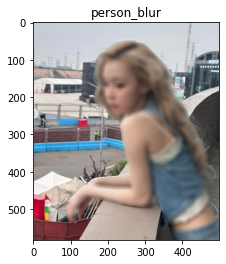

In [23]:
def picture_person_blur():
    # Q. 이번에는 사람 부분을 블러로, 배경 부분을 원본으로 출력해볼까요?
    # 힌트 : img_mask_color 옵션을 적절히 조정해주고, img_orig, img_orig_blur 를 활용하세요.
    img_concat = np.where(img_mask_color == 255, img_orig_blur, img_orig )
    plt.title('person_blur')
    plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
    plt.show()

picture_person_blur()

### 먼저 각 블록별로 모듈화 시켜서 이후 다양한 사진에 대해 어떤 반응을 보이는지 확인한다.
1. 각 블록별로 함수를 만들어서 테스트 케이스를 돌리는 함수를 만든다.
2. 각 테스트 케이스는 (사람 부분 블러, 배경원본),(사람부분 원본),(배경 원본) 이런식으로 진행한다.
3. 또한 각 테스트 케이스는 이 이미지에 어떤 것들이 잡히는지 라벨을 출력해준다.
---

파일이름을 알려주세요: image2
이미지 크기: (583, 498, 3)


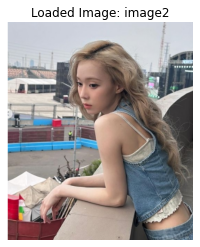

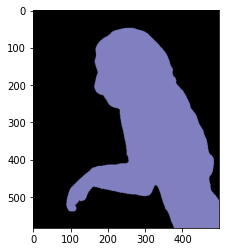

background
person
15번째 배열: [192 128 128]
(583, 498)


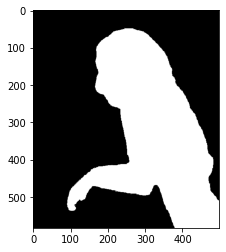

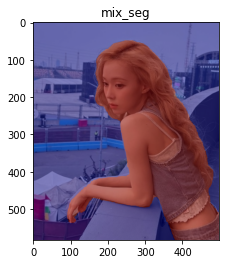

블러 정도를 입력해주세요:13


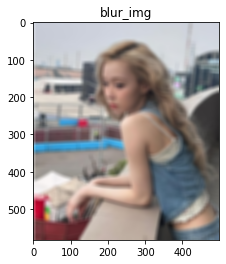

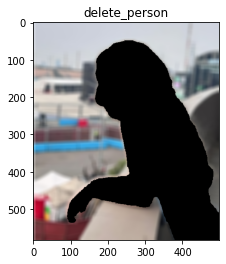

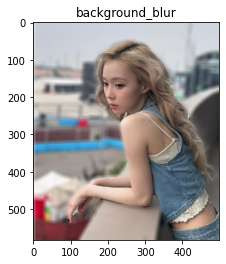

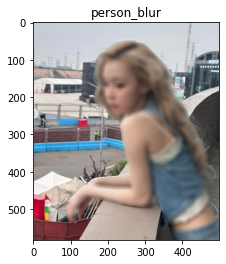

In [28]:
def Solution():
    load_image()
    initial_segmentation()
    segvalues
    print_label()
    make_colormap()
    segment_person()
    mix_seg()
    blur_img()
    delete_person()
    picture_background_blur()
    picture_person_blur()

Solution()

#### 일단 모듈화 시키는 것은 성공했다.

1. 이제부터는 다양한 사례들을 보고 어떤 문제점들이 있는지 알아보자

파일이름을 알려주세요:espa
(658, 647, 3)


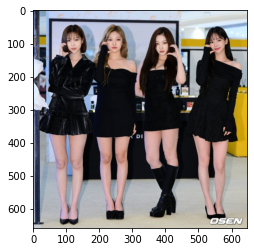

성공


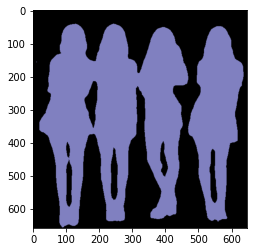

background
person
15번째 배열: [192 128 128]
(658, 647)


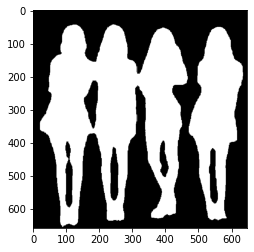

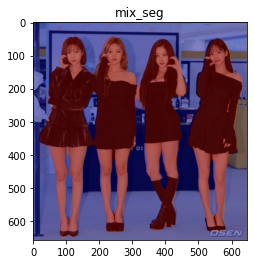

블러 정도를 입력해주세요:15


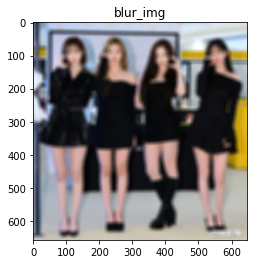

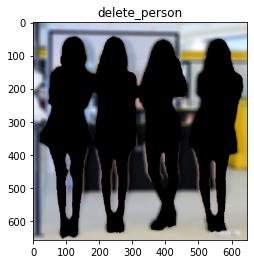

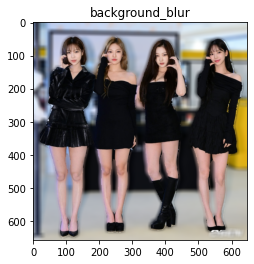

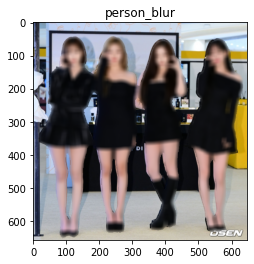

In [17]:
# 단체사진일 경우
Solution()

#### 단체 사진일 경우에도 잘 된다.

1. 잘 인식하는 모습이다.

파일이름을 알려주세요:espa_concert
(467, 700, 3)


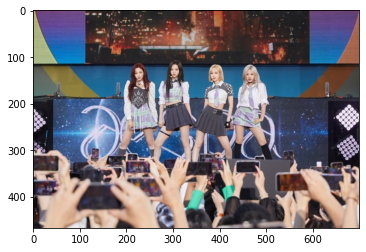

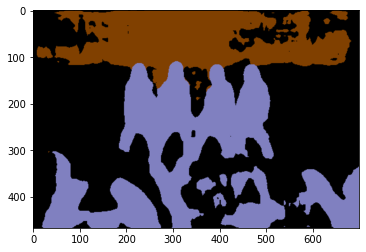

background
person
tv
15번째 배열: [192 128 128]
(467, 700)


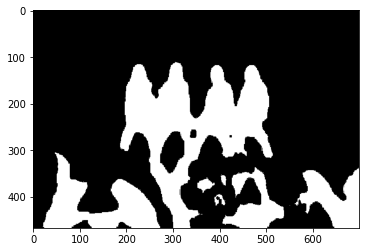

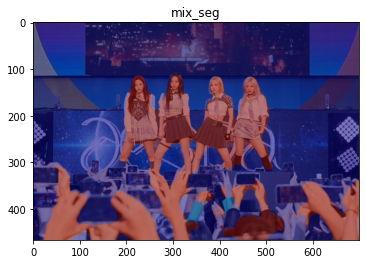

블러 정도를 입력해주세요:5


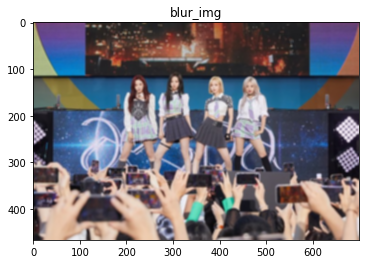

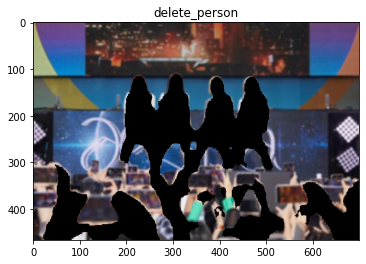

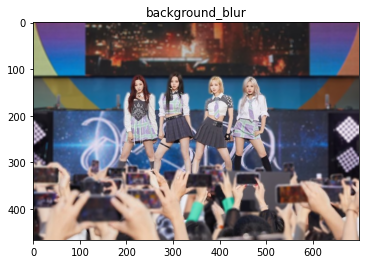

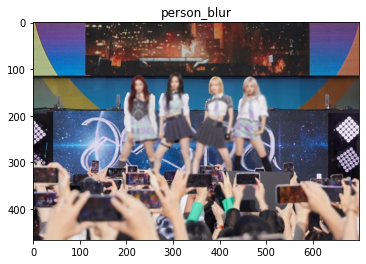

In [33]:
# 앞에 사람 손이 있을 경우
Solution()


#### 앞에 인물이 있다보니 제대로 인식하지 못하는 문제점이 발생한다.

1. 중앙에 있는 인물들만 수집하는 방법
2. 일부분을 자른다.
---
##### 1번 중앙에 있는 인물들만 수집하는 방법 실행해보기

In [40]:
def keep_center_person(seg_map):
    """
    중심에 가까운 인물 N명만 남기는 함수
    - seg_map: 사람이 있는 영역이 True인 마스크
    - num_people: 사용자 입력으로 받음
    """
    # 사용자에게 몇 명을 남길지 입력받기
    num_people = int(input("사진에서 남기고 싶은 인물 수를 입력하세요 (예: 1, 2, 3): "))

    # 연결된 인물 영역(connected components) 찾기
    labeled_array, num_features = scipy.ndimage.label(seg_map)

    # 이미지 중심
    h, w = seg_map.shape
    center_y, center_x = h // 2, w // 2

    people_info = []

    for label in range(1, num_features + 1):
        coords = np.argwhere(labeled_array == label)
        if len(coords) == 0:
            continue

        # 인물 중심 좌표 계산
        y_mean = np.mean(coords[:, 0])
        x_mean = np.mean(coords[:, 1])

        # 중심점까지의 거리 계산
        distance = np.sqrt((y_mean - center_y)**2 + (x_mean - center_x)**2)

        people_info.append((label, distance))

    # 중심에 가까운 순으로 정렬 후 상위 num_people만 선택
    people_info.sort(key=lambda x: x[1])
    selected_labels = [label for label, _ in people_info[:num_people]]

    # 새로운 마스크 생성
    new_mask = np.isin(labeled_array, selected_labels)

    return new_mask

In [41]:
def Solution_v1():
    global seg_map 
    load_image()
    initial_segmentation()
    segvalues
    print_label()
    make_colormap()
    segment_person()
    seg_map = keep_center_person(seg_map)  # 이제 num_people 인자는 제거!
    mix_seg()
    blur_img()
    delete_person()
    picture_background_blur()
    picture_person_blur()

파일이름을 알려주세요: espa_concert
이미지 크기: (467, 700, 3)


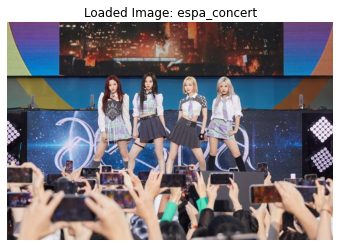

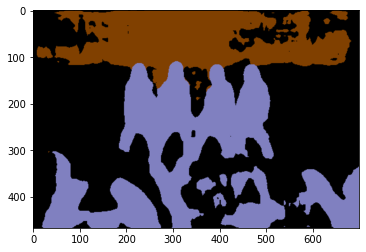

background
person
tv
15번째 배열: [192 128 128]
(467, 700)


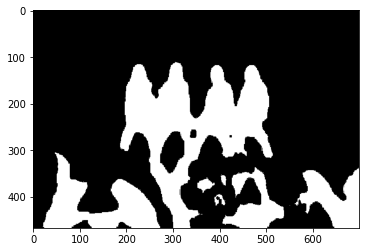

사진에서 남기고 싶은 인물 수를 입력하세요 (예: 1, 2, 3): 4


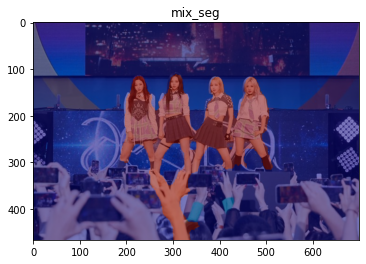

블러 정도를 입력해주세요:15


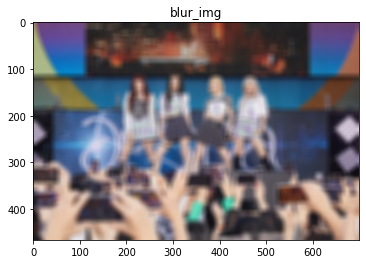

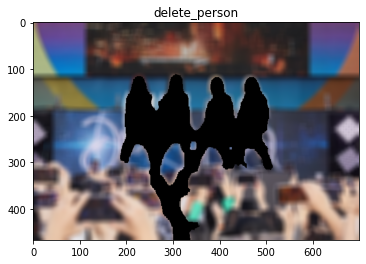

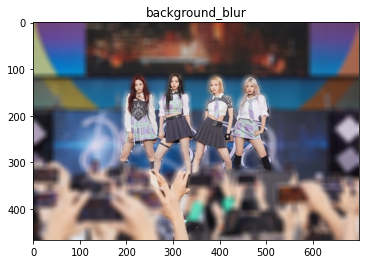

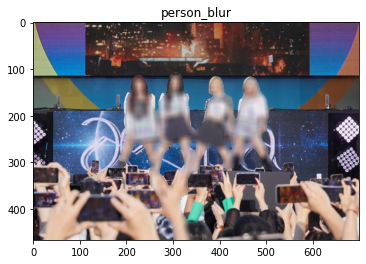

In [42]:
Solution_v1()


### 손이 같이 인식되는 경우가 발생한다.

1. 중앙에 있는 인물들만 수집하는 방법
2. 일부분을 자른다. <-- 2번을 적용해본다
---
##### 2번 일부분을 자르는 방법 실행해본다.

In [43]:
def apply_xy_mask_filter(seg_map):
    """
    사용자 입력을 받아 x/y 범위 기반으로 seg_map을 잘라내는 함수
    """
    h, w = seg_map.shape
    print(f"전체 이미지 크기 - 높이(y): 0 ~ {h}, 너비(x): 0 ~ {w}")

    # X축 필터링 여부
    use_x = input("1. x 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): ").strip().upper()
    if use_x == "Y":
        x_start = int(input(f"3. x 축 시작 위치를 입력하세요 (0 ~ {w}): "))
        x_end = int(input(f"3. x 축 끝 위치를 입력하세요 ({x_start} ~ {w}): "))
        seg_map[:, :x_start] = False
        seg_map[:, x_end:] = False
        print(f"x 축 범위 필터링 적용됨: {x_start} ~ {x_end}")
    else:
        print("x 축 필터링 건너뜀")

    # Y축 필터링 여부
    use_y = input("4. y 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): ").strip().upper()
    if use_y == "Y":
        y_start = int(input(f"6. y 축 시작 위치를 입력하세요 (0 ~ {h}): "))
        y_end = int(input(f"6. y 축 끝 위치를 입력하세요 ({y_start} ~ {h}): "))
        seg_map[:y_start, :] = False
        seg_map[y_end:, :] = False
        print(f"y 축 범위 필터링 적용됨: {y_start} ~ {y_end}")
    else:
        print("y 축 필터링 건너뜀")

    return seg_map


In [46]:
def Solution_v2():
    global seg_map
    load_image()
    initial_segmentation()
    segvalues
    print_label()
    make_colormap()
    segment_person()
    seg_map = keep_center_person(seg_map)        # 중앙 인물 선택
    mix_seg()                                    # 1번 결과물 확인
    seg_map = apply_xy_mask_filter(seg_map)      # ✅ x/y 축 필터링 추가
    mix_seg()                                    # 필터링 된거 결과 확인
    blur_img()
    delete_person()
    picture_background_blur()
    picture_person_blur()

파일이름을 알려주세요: espa_concert
이미지 크기: (467, 700, 3)


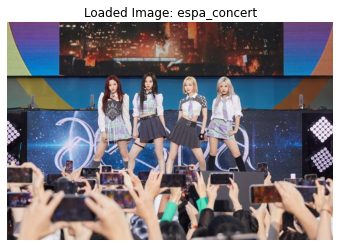

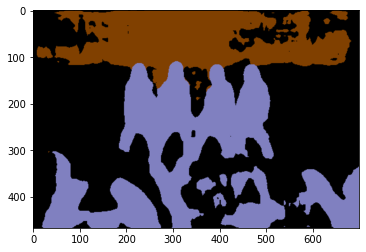

background
person
tv
15번째 배열: [192 128 128]
(467, 700)


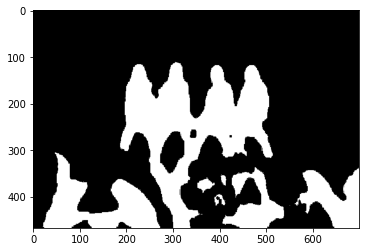

사진에서 남기고 싶은 인물 수를 입력하세요 (예: 1, 2, 3): 4


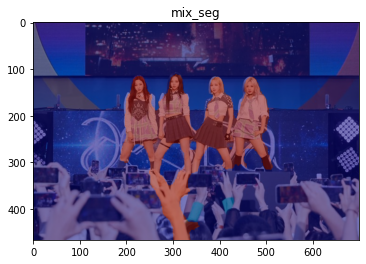

전체 이미지 크기 - 높이(y): 0 ~ 467, 너비(x): 0 ~ 700
1. x 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): N
x 축 필터링 건너뜀
4. y 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): Y
6. y 축 시작 위치를 입력하세요 (0 ~ 467): 100
6. y 축 끝 위치를 입력하세요 (100 ~ 467): 320
y 축 범위 필터링 적용됨: 100 ~ 320


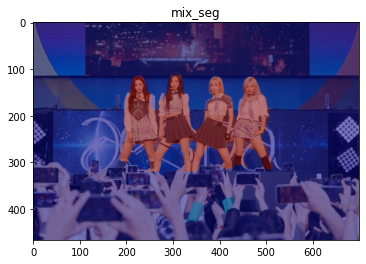

블러 정도를 입력해주세요:50


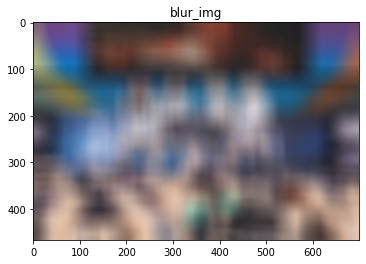

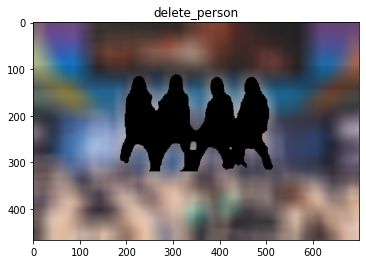

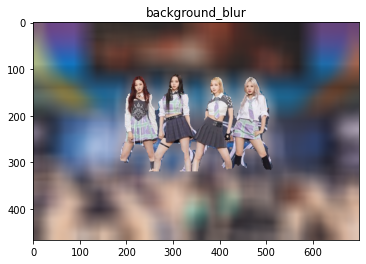

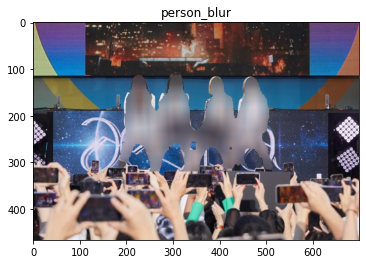

In [48]:
Solution_v2()


### 되긴 된다. 그런데 약간 사용성 측면에서 떨어진다. 
필터링 입력값을 넣었을 때 잘못자르면 처음부터 다 다시 해야한다. 그래서 반복문을 이용해 원하는게 나올 때까지 반복해보는 코드를 넣을 것이다.

반복문을 적용해 새로운 코드를 짠다.

---

In [52]:
def Solution_v3():
    global seg_map
    load_image()
    initial_segmentation()
    segvalues
    print_label()
    make_colormap()
    segment_person()
    
    seg_map = keep_center_person(seg_map)  # 중앙 인물 선택
    mix_seg()  # 1차 결과 확인 (중앙 인물만)

    # 반복적으로 필터링 재시도 가능
    while True:
        seg_map = apply_xy_mask_filter(seg_map)  # 필터 적용
        mix_seg()  # 필터 적용된 결과 확인

        retry = input("이 결과가 마음에 드시나요? (Y/N): ").strip().upper()
        if retry == "Y":
            break
        else:
            print("필터링을 다시 진행합니다...")
            segment_person()  # seg_map을 원래대로 다시 생성
            seg_map = keep_center_person(seg_map)  # 다시 중앙 인물 선택
            mix_seg()  # 1차 결과 확인 (중앙 인물만)
            

    blur_img()
    delete_person()
    picture_background_blur()
    picture_person_blur()


파일이름을 알려주세요: espa_concert
이미지 크기: (467, 700, 3)


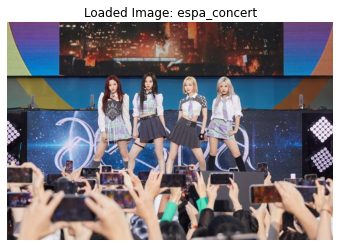

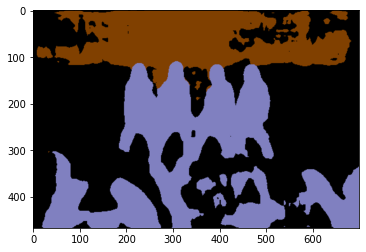

background
person
tv
15번째 배열: [192 128 128]
(467, 700)


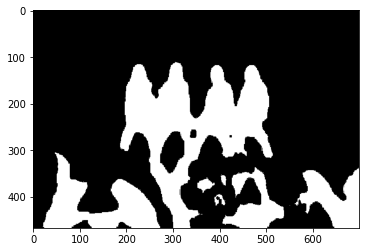

사진에서 남기고 싶은 인물 수를 입력하세요 (예: 1, 2, 3): 4


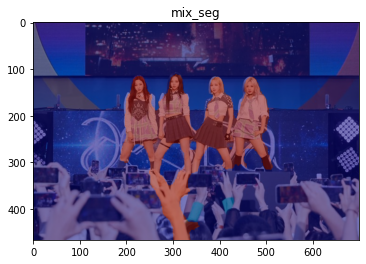

전체 이미지 크기 - 높이(y): 0 ~ 467, 너비(x): 0 ~ 700
1. x 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): N
x 축 필터링 건너뜀
4. y 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): N
y 축 필터링 건너뜀


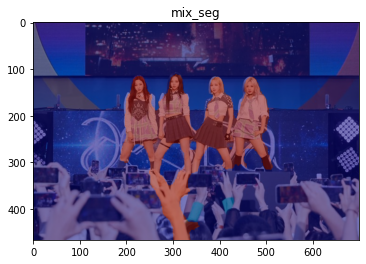

이 결과가 마음에 드시나요? (Y/N): N
필터링을 다시 진행합니다...
(467, 700)


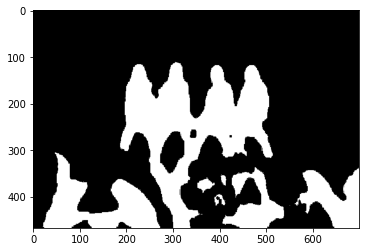

사진에서 남기고 싶은 인물 수를 입력하세요 (예: 1, 2, 3): 4


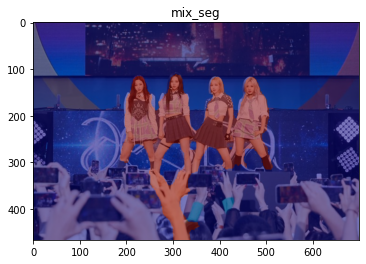

전체 이미지 크기 - 높이(y): 0 ~ 467, 너비(x): 0 ~ 700
1. x 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): Y
3. x 축 시작 위치를 입력하세요 (0 ~ 700): 0
3. x 축 끝 위치를 입력하세요 (0 ~ 700): 600
x 축 범위 필터링 적용됨: 0 ~ 600
4. y 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): Y
6. y 축 시작 위치를 입력하세요 (0 ~ 467): 100
6. y 축 끝 위치를 입력하세요 (100 ~ 467): 320
y 축 범위 필터링 적용됨: 100 ~ 320


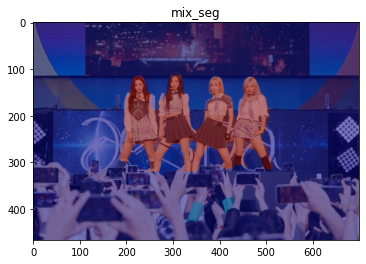

이 결과가 마음에 드시나요? (Y/N): Y
블러 정도를 입력해주세요:13


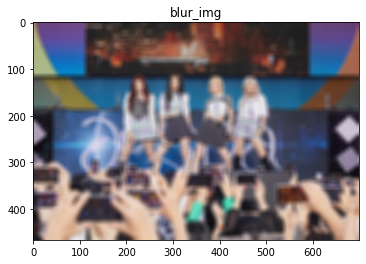

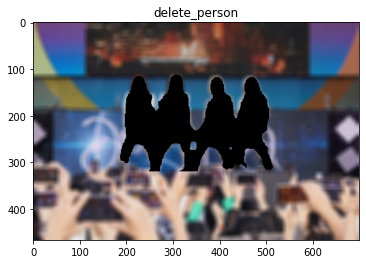

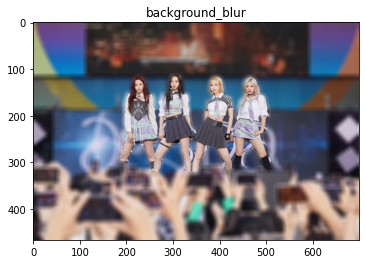

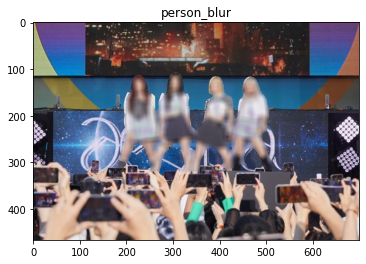

In [53]:
Solution_v3()


### 사용성은 이제 챙겼다 
이제 새로운 문제점을 찾아보자

고양이를 한번 해보자 

---

파일이름을 알려주세요: cat
이미지 크기: (329, 518, 3)


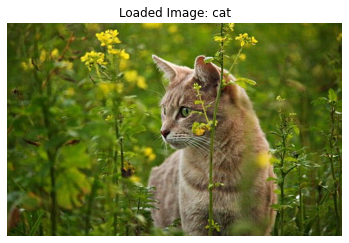

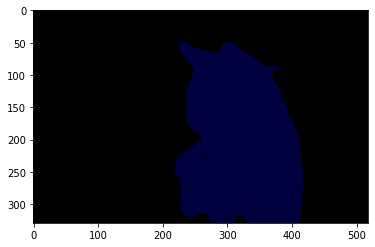

background
cat
15번째 배열: [192 128 128]
(329, 518)


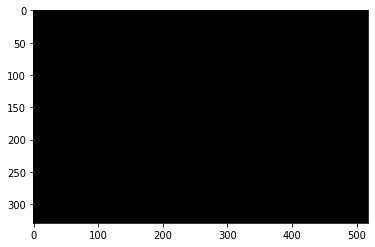

사진에서 남기고 싶은 인물 수를 입력하세요 (예: 1, 2, 3): 1


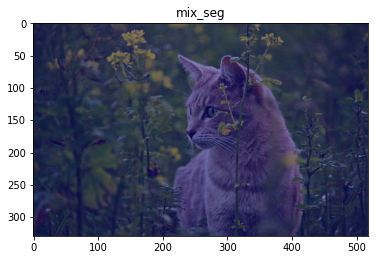

전체 이미지 크기 - 높이(y): 0 ~ 329, 너비(x): 0 ~ 518
1. x 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): N
x 축 필터링 건너뜀
4. y 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): N
y 축 필터링 건너뜀


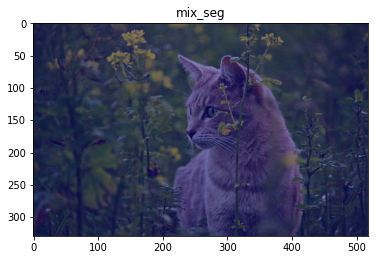

이 결과가 마음에 드시나요? (Y/N): Y
블러 정도를 입력해주세요:13


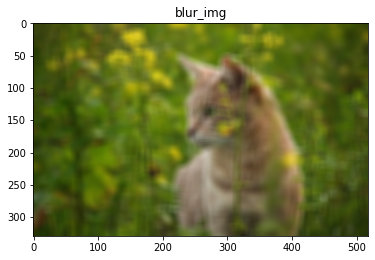

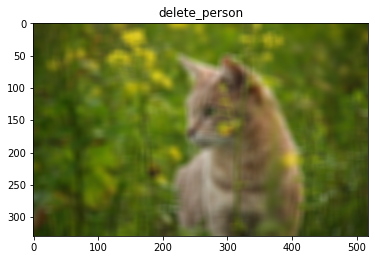

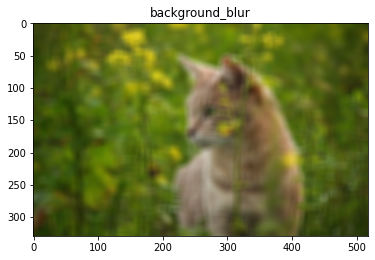

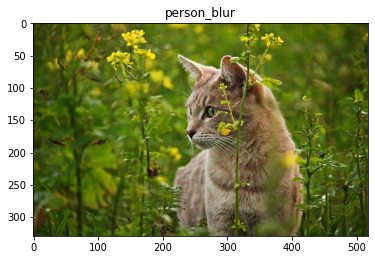

In [56]:
Solution_v3()

### 기존 코드 자체에 문제점이 존재했다.
---

뭐냐면 내가 colormap 함수에서 15번으로만 해놔서 그렇다.

이를 수정해보자. 

동적으로 라벨이름 -> 색상 매핑으로 바꿔준다. 

In [60]:
def make_colormap():
    global colormap, seg_color

    colormap = np.zeros((256, 3), dtype=int)
    ind = np.arange(256, dtype=int)

    for shift in reversed(range(8)):
        for channel in range(3):
            colormap[:, channel] |= ((ind >> channel) & 1) << shift
        ind >>= 3

    # 📌 여기서 LABEL_NAMES 사용
    print("사용 가능한 클래스 목록:")
    print(LABEL_NAMES)

    class_name = input("세그멘테이션에서 추출할 클래스 이름을 입력하세요 (예: person, cat, tv): ").strip().lower()

    if class_name not in LABEL_NAMES:
        print(f"❌ '{class_name}' 클래스는 지원되지 않습니다.")
        return

    class_index = LABEL_NAMES.index(class_name)
    color_rgb = colormap[class_index]
    seg_color = tuple(color_rgb[::-1])  # RGB → BGR 변환

    print(f"'{class_name}' 클래스 (index: {class_index})에 대한 색상 (BGR): {seg_color}")


In [61]:
def Solution_v4():
    global seg_map
    load_image()
    initial_segmentation()
    segvalues
    print_label()
    make_colormap()
    segment_person()
    
    seg_map = keep_center_person(seg_map)  # 중앙 인물 선택
    mix_seg()  # 1차 결과 확인 (중앙 인물만)

    # 반복적으로 필터링 재시도 가능
    while True:
        seg_map = apply_xy_mask_filter(seg_map)  # 필터 적용
        mix_seg()  # 필터 적용된 결과 확인

        retry = input("이 결과가 마음에 드시나요? (Y/N): ").strip().upper()
        if retry == "Y":
            break
        else:
            print("필터링을 다시 진행합니다...")
            segment_person()  # seg_map을 원래대로 다시 생성
            seg_map = keep_center_person(seg_map)  # 다시 중앙 인물 선택
            mix_seg()  # 1차 결과 확인 (중앙 인물만)
            

    blur_img()
    delete_person()
    picture_background_blur()
    picture_person_blur()

파일이름을 알려주세요: cat
이미지 크기: (329, 518, 3)


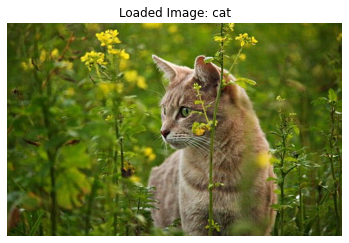

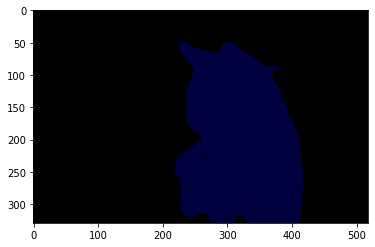

background
cat
사용 가능한 클래스 목록:
['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv']
세그멘테이션에서 추출할 클래스 이름을 입력하세요 (예: person, cat, tv): cat
'cat' 클래스 (index: 8)에 대한 색상 (BGR): (0, 0, 64)
(329, 518)


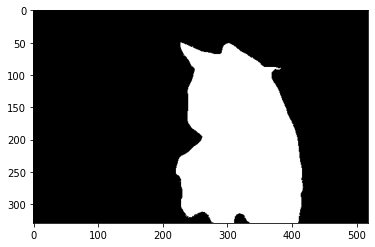

사진에서 남기고 싶은 인물 수를 입력하세요 (예: 1, 2, 3): 1


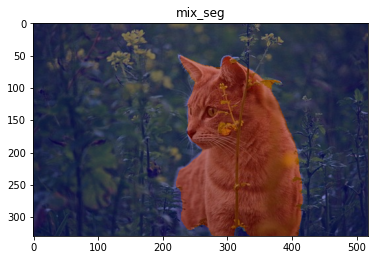

전체 이미지 크기 - 높이(y): 0 ~ 329, 너비(x): 0 ~ 518
1. x 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): N
x 축 필터링 건너뜀
4. y 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): N
y 축 필터링 건너뜀


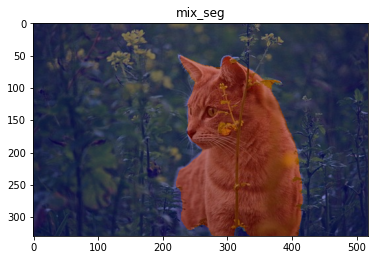

이 결과가 마음에 드시나요? (Y/N): Y
블러 정도를 입력해주세요:13


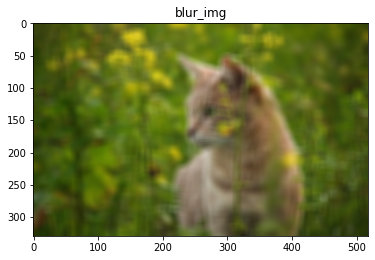

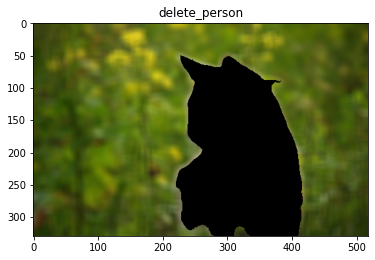

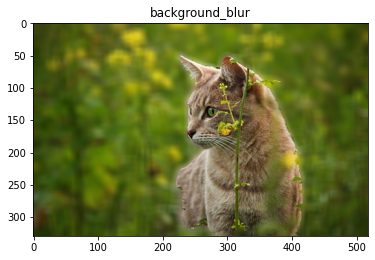

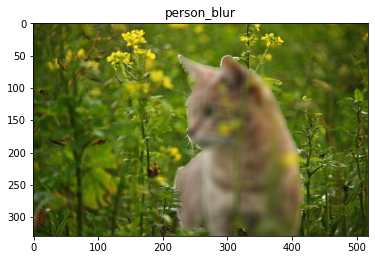

In [62]:
Solution_v4()

### 성공은 했으나, 약간의 문제점이 있다.

1. 중앙에 있는 꽃도 고양이의 일부로 인식되서 같이 뭉탱이로 된다.
2. 그렇다면 어떻게 해야 이걸 해결할 수 있을까?
3. 일단 클래스가 선언이 안되어서 스킵

### 문득 든 의문은 그러면 만약에 다른 클래스 둘이 겹쳐져 있으면 어떻게 되지? 사람이랑 고양이랑

---

파일이름을 알려주세요: cat_human
이미지 크기: (834, 554, 3)


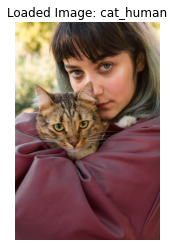

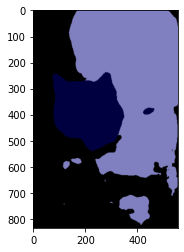

background
cat
person
사용 가능한 클래스 목록:
['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv']
세그멘테이션에서 추출할 클래스 이름을 입력하세요 (예: person, cat, tv): person, cat
❌ 'person, cat' 클래스는 지원되지 않습니다.
(834, 554)


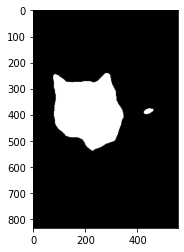

사진에서 남기고 싶은 인물 수를 입력하세요 (예: 1, 2, 3): 1


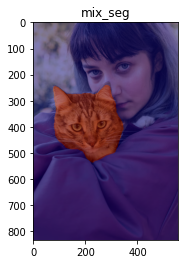

전체 이미지 크기 - 높이(y): 0 ~ 834, 너비(x): 0 ~ 554
1. x 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): N
x 축 필터링 건너뜀
4. y 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): N
y 축 필터링 건너뜀


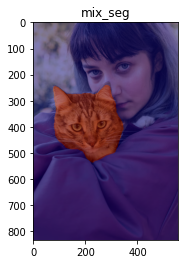

이 결과가 마음에 드시나요? (Y/N): Y
블러 정도를 입력해주세요:10


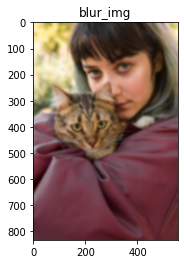

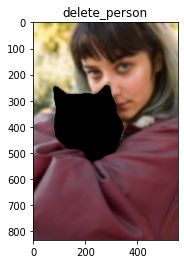

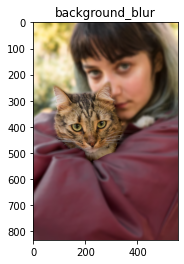

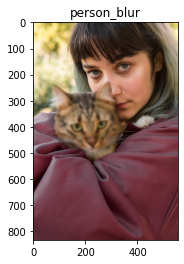

In [64]:
Solution_v4()

### 아 지금 문제가 발생하는건 두개가 동시에는 안된다. 그러면 두개 동시에 되게 해보자

1. 사람, 고양이 모두다 가능하도록

In [67]:
## 다중 클래스여도 충분히 적용 가능하도록
def make_colormap():
    global colormap, seg_colors  # seg_colors는 여러 클래스일 경우 리스트로!

    # color map 생성
    colormap = np.zeros((256, 3), dtype=int)
    ind = np.arange(256, dtype=int)
    for shift in reversed(range(8)):
        for channel in range(3):
            colormap[:, channel] |= ((ind >> channel) & 1) << shift
        ind >>= 3

    print("사용 가능한 클래스 목록:")
    print(LABEL_NAMES)

    # 클래스 여러 개 입력받기
    input_str = input("세그멘테이션에서 추출할 클래스 이름을 입력하세요 (쉼표로 구분, 예: person, cat): ").strip().lower()
    class_names = [name.strip() for name in input_str.split(',')]

    seg_colors = []
    for class_name in class_names:
        if class_name not in LABEL_NAMES:
            print(f"❌ '{class_name}' 클래스는 지원되지 않습니다.")
            continue
        class_index = LABEL_NAMES.index(class_name)
        color_rgb = colormap[class_index]
        seg_colors.append(tuple(color_rgb[::-1]))  # BGR

    if not seg_colors:
        print("⚠️ 선택된 클래스가 없습니다. 기본값 person으로 설정합니다.")
        class_index = LABEL_NAMES.index('person')
        seg_colors = [tuple(colormap[class_index][::-1])]
    
    print(f"선택된 클래스 색상(BGR): {seg_colors}")


In [72]:
## d여러개의 segment를 비교하도록
def segment_compare():
    global seg_map
    seg_map = np.zeros(output.shape[:2], dtype=bool)
    for color in seg_colors:
        seg_map |= np.all(output == color, axis=-1)


In [73]:
def Solution_v4():
    global seg_map
    load_image()
    initial_segmentation()
    segvalues
    print_label()
    make_colormap() # <<-- 여기 바꿈
    segment_compare() # <<- 여기 바꿈
    
    seg_map = keep_center_person(seg_map)  # 중앙 인물 선택
    mix_seg()  # 1차 결과 확인 (중앙 인물만)

    # 반복적으로 필터링 재시도 가능
    while True:
        seg_map = apply_xy_mask_filter(seg_map)  # 필터 적용
        mix_seg()  # 필터 적용된 결과 확인

        retry = input("이 결과가 마음에 드시나요? (Y/N): ").strip().upper()
        if retry == "Y":
            break
        else:
            print("필터링을 다시 진행합니다...")
            segment_person()  # seg_map을 원래대로 다시 생성
            seg_map = keep_center_person(seg_map)  # 다시 중앙 인물 선택
            mix_seg()  # 1차 결과 확인 (중앙 인물만)
            

    blur_img()
    delete_person()
    picture_background_blur()
    picture_person_blur()

파일이름을 알려주세요: cat_human
이미지 크기: (834, 554, 3)


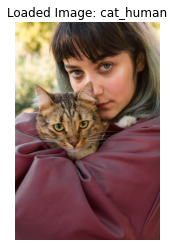

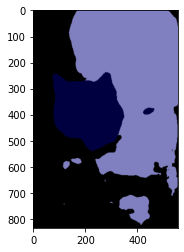

background
cat
person
사용 가능한 클래스 목록:
['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv']
세그멘테이션에서 추출할 클래스 이름을 입력하세요 (쉼표로 구분, 예: person, cat): person, cat
선택된 클래스 색상(BGR): [(128, 128, 192), (0, 0, 64)]
사진에서 남기고 싶은 인물 수를 입력하세요 (예: 1, 2, 3): 2


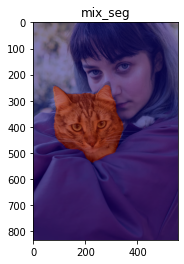

전체 이미지 크기 - 높이(y): 0 ~ 834, 너비(x): 0 ~ 554
1. x 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): N
x 축 필터링 건너뜀
4. y 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): N
y 축 필터링 건너뜀


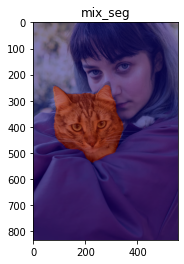

이 결과가 마음에 드시나요? (Y/N): Y
블러 정도를 입력해주세요:13


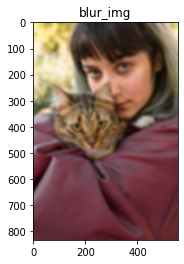

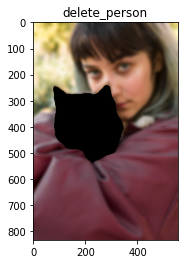

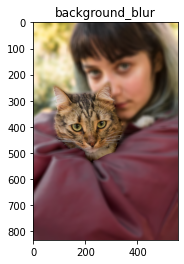

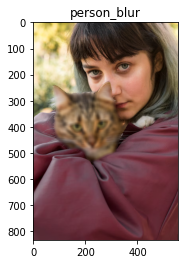

In [74]:
 Solution_v4()

### 아 이제 이전에 했던게 문제가 된다.

```python
def keep_center_person(seg_map):
    """
    중심에 가까운 인물 N명만 남기는 함수
    - seg_map: 사람이 있는 영역이 True인 마스크
    - num_people: 사용자 입력으로 받음
    """
    # 사용자에게 몇 명을 남길지 입력받기
    num_people = int(input("사진에서 남기고 싶은 인물 수를 입력하세요 (예: 1, 2, 3): "))

    # 연결된 인물 영역(connected components) 찾기
    labeled_array, num_features = scipy.ndimage.label(seg_map)

    # 이미지 중심
    h, w = seg_map.shape
    center_y, center_x = h // 2, w // 2

    people_info = []

    for label in range(1, num_features + 1):
        coords = np.argwhere(labeled_array == label)
        if len(coords) == 0:
            continue

        # 인물 중심 좌표 계산
        y_mean = np.mean(coords[:, 0])
        x_mean = np.mean(coords[:, 1])

        # 중심점까지의 거리 계산
        distance = np.sqrt((y_mean - center_y)**2 + (x_mean - center_x)**2)

        people_info.append((label, distance))

    # 중심에 가까운 순으로 정렬 후 상위 num_people만 선택
    people_info.sort(key=lambda x: x[1])
    selected_labels = [label for label, _ in people_info[:num_people]]

    # 새로운 마스크 생성
    new_mask = np.isin(labeled_array, selected_labels)

    return new_mask
```

여기서     # 사용자에게 몇 명을 남길지 입력받기
    num_people = int(input("사진에서 남기고 싶은 인물 수를 입력하세요 (예: 1, 2, 3): "))
    
    이거가 이전에는 뚜렷하게 나뉘어져서 가능했는데 이번엔 너무 자잘하게 있다보니 답이없다.
    인물수 제한 없이 하는 답변을 하나가 만들어야겠다 X 를 입력하면 그냥 skip

In [78]:
## 재선언 진행
def keep_center_objects(seg_map):
    """
    중심에 가까운 객체 N개만 남기거나, 필터링을 건너뛰는 함수
    - seg_map: True로 마킹된 영역 마스크
    - 사용자 입력:
        - X: 필터링 없이 전체 유지
        - 숫자: 중심에 가까운 N개만 유지
    """
    user_input = input("사진에서 남기고 싶은 객체 수를 입력하세요 (X를 입력하면 필터링을 건너뜁니다): ").strip().upper()

    if user_input == "X":
        print("❎ 필터링 건너뜀 — 모든 객체 유지")
        return seg_map

    try:
        num_objects = int(user_input)
    except ValueError:
        print("❌ 잘못된 입력입니다. 기본값으로 전체 유지합니다.")
        return seg_map

    # 연결된 객체 찾기
    labeled_array, num_features = scipy.ndimage.label(seg_map)
    h, w = seg_map.shape
    center_y, center_x = h // 2, w // 2

    objects = []
    for label in range(1, num_features + 1):
        coords = np.argwhere(labeled_array == label)
        if len(coords) == 0:
            continue
        y_mean = np.mean(coords[:, 0])
        x_mean = np.mean(coords[:, 1])
        dist = np.sqrt((y_mean - center_y) ** 2 + (x_mean - center_x) ** 2)
        objects.append((label, dist))

    objects.sort(key=lambda x: x[1])
    selected_labels = [label for label, _ in objects[:num_objects]]
    new_mask = np.isin(labeled_array, selected_labels)

    print(f"✅ 중심 객체 {num_objects}개만 남김")
    return new_mask


In [79]:
def Solution_v5():
    global seg_map
    load_image()
    initial_segmentation()
    segvalues
    print_label()
    make_colormap() # <<-- 여기 바꿈
    segment_compare() # <<- 여기 바꿈
    
    seg_map = keep_center_objects(seg_map)  # 중앙 인물 선택
    mix_seg()  # 1차 결과 확인 (중앙 인물만)

    # 반복적으로 필터링 재시도 가능
    while True:
        seg_map = apply_xy_mask_filter(seg_map)  # 필터 적용
        mix_seg()  # 필터 적용된 결과 확인

        retry = input("이 결과가 마음에 드시나요? (Y/N): ").strip().upper()
        if retry == "Y":
            break
        else:
            print("필터링을 다시 진행합니다...")
            segment_person()  # seg_map을 원래대로 다시 생성
            seg_map = keep_center_objects(seg_map)  # 다시 중앙 인물 선택
            mix_seg()  # 1차 결과 확인 (중앙 인물만)
            

    blur_img()
    delete_person()
    picture_background_blur()
    picture_person_blur()

파일이름을 알려주세요: cat_human
이미지 크기: (834, 554, 3)


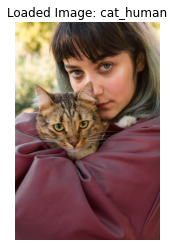

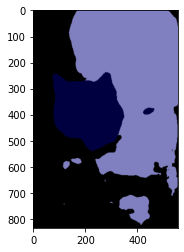

background
cat
person
사용 가능한 클래스 목록:
['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv']
세그멘테이션에서 추출할 클래스 이름을 입력하세요 (쉼표로 구분, 예: person, cat): cat, person
선택된 클래스 색상(BGR): [(0, 0, 64), (128, 128, 192)]
사진에서 남기고 싶은 객체 수를 입력하세요 (X를 입력하면 필터링을 건너뜁니다): X
❎ 필터링 건너뜀 — 모든 객체 유지


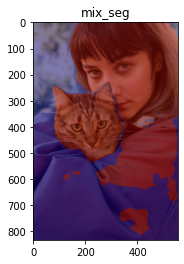

전체 이미지 크기 - 높이(y): 0 ~ 834, 너비(x): 0 ~ 554
1. x 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): N
x 축 필터링 건너뜀
4. y 축을 기준으로 부분적으로 살릴 것이냐? (Y/N): N
y 축 필터링 건너뜀


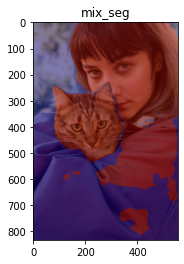

이 결과가 마음에 드시나요? (Y/N): Y
블러 정도를 입력해주세요:13


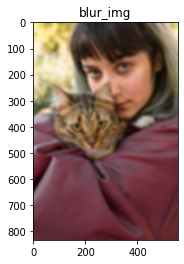

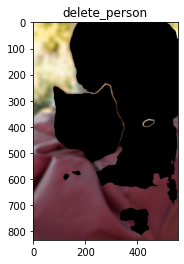

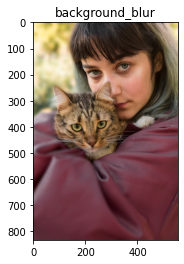

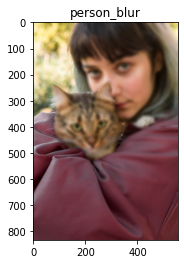

In [80]:
Solution_v5()

### 얼추 잘 된 것 같다.. 힘들었다

# 회고
---

1. 변수끼리 어떻게 상호작용 하는지를 정리할 필요가 있었다.
2. 특히 colormap을 가지고 잘 가지고 놀아야한다.
3. 그리고 이게 사실 스티커처럼 뗏다가 붙였다가 느낌이라는건 알겠다.

# 📘 변수 상호작용 정리 (Solution_v5 기준)

---

## 1. 📁 입력 이미지 처리 관련

| 변수명       | 설명                                 | 생성 위치        | 사용 위치                  |
|:------------|:-------------------------------------|:------------------|:----------------------------|
| `img_path`  | 이미지 파일 경로                     | `load_image()`    | `initial_segmentation()`   |
| `img_orig`  | 원본 이미지 (BGR)                    | `load_image()`    | 전체 파이프라인 기본 입력 |

---

## 2. 🧠 세그멘테이션 모델 및 출력

| 변수명        | 설명                                               | 생성 위치           | 사용 위치               |
|:-------------|:---------------------------------------------------|:---------------------|:-------------------------|
| `model`      | 세그멘테이션 모델 객체                             | `pixellib_load()`    | `initial_segmentation()`|
| `output`     | 세그멘테이션 결과 이미지 (BGR 색상값)             | `initial_segmentation()` | `segment_compare()` |
| `segvalues`  | 클래스 정보 딕셔너리 (`class_ids`, `masks`)        | `initial_segmentation()` | `print_label()` 등 |
| `LABEL_NAMES`| Pascal VOC 라벨 이름 목록                          | 전역 상수            | `make_colormap()`       |

---

## 3. 🎨 클래스 및 색상 매핑

| 변수명        | 설명                                         | 생성 위치         | 사용 위치          |
|:-------------|:---------------------------------------------|:------------------|:-------------------|
| `colormap`   | 클래스 인덱스별 RGB 컬러 테이블              | `make_colormap()` | 내부 사용          |
| `seg_colors` | 선택된 클래스들의 BGR 색상 리스트            | `make_colormap()` | `segment_compare()`|

---

## 4. 🧼 객체 마스크 처리

| 변수명         | 설명                                               | 생성 위치          | 사용 위치                                      |
|:--------------|:--------------------------------------------------|:-------------------|:----------------------------------------------|
| `seg_map`      | 선택된 클래스 영역만 True로 된 마스크 배열         | `segment_compare()`| `keep_center_objects()`, `apply_xy_mask_filter()` |
| `img_mask`     | `seg_map`을 0/255로 변환한 uint8 마스크           | `mix_seg()`        | `img_mask_color` 생성                          |
| `img_mask_color`| 3채널 흑백 마스크 (BGR)                          | `delete_person()`  | `bitwise_and`, `np.where` 에 사용             |

---

## 5. 🧪 블러 및 결과 이미지 생성

| 변수명         | 설명                                                | 생성 위치     | 사용 위치                               |
|:--------------|:---------------------------------------------------|:--------------|:----------------------------------------|
| `img_orig_blur`| 블러 처리된 원본 이미지                           | `blur_img()`  | `delete_person()`, `picture_person_blur()` |
| `img_bg_blur`  | 객체가 제거된 배경 블러 이미지                    | `delete_person()` | `picture_background_blur()`         |
| `img_show`     | 마스크와 원본 합성된 시각화 이미지                | `mix_seg()`   | 사용자 확인용 출력                      |
| `img_concat`   | 최종 결과 이미지 (`np.where`로 마스크 적용됨)     | `picture_background_blur()` 등 | 최종 출력 |





주요 변수 변화:

1. 이미지 로딩: img_path, img_orig
2. 세그멘테이션: output, segvalues
3. 색상 매핑: colormap, seg_colors
4. 마스크 처리: seg_map, img_mask, img_show
5. 블러 처리: img_orig_blur, img_bg_blur, img_concat